In [39]:
import numpy as np
from tslearn.preprocessing import *

In [123]:
def simu_gen(n:int=60, rg:list=[30, 100], v:list=[100, 50], vl:list=[500, 200],pl=0.8 , cn=[0, 10], p:float=0.9, seed=123):
    np.random.seed(seed)
    c_a = np.random.uniform(rg[0], rg[1], n)
    ref = np.array([ i * 1 for i in c_a for j in range(0, v[0])])
    #debug testing
    c_raw = []
    dlt = []
    for idx, i in enumerate(c_a):
        if np.random.binomial(1, p):
            c_raw = c_raw + [i]
        else:
            dlt = dlt + [idx]
    v_a = np.array([np.random.normal(v[0], v[1]) if np.random.binomial(1, pl) else np.random.normal(vl[0], vl[1]) for i in range(len(c_raw))])
    level = []
    for i in zip(c_raw, v_a):
        level = level + [i[0]] * int(i[1])
    level = np.array(level)
    raw = np.array([i + np.random.normal(cn[0], cn[1]) for i in level])
    return [ref, level, raw, dlt]

In [124]:
s = simu_gen(cn=[0, 3])

In [4]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')
%matplotlib inline

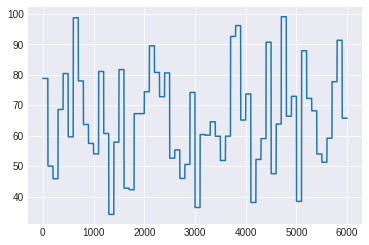

In [12]:
plt.plot(s[0]);

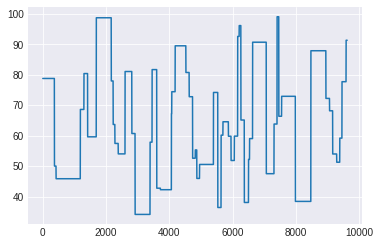

In [13]:
plt.plot(s[1]);

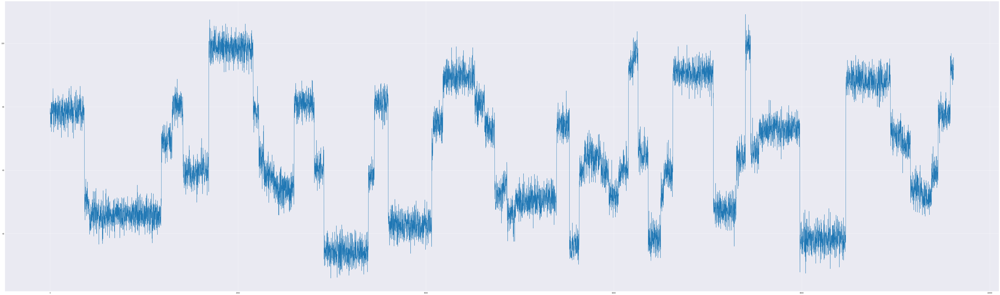

In [14]:
plt.figure(figsize=(100,30))
plt.plot(s[2]);

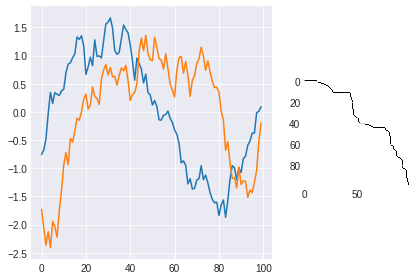

In [17]:
import numpy
import matplotlib.pyplot as plt

from tslearn.generators import random_walks
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn import metrics

numpy.random.seed(0)
n_ts, sz, d = 2, 100, 1
dataset = random_walks(n_ts=n_ts, sz=sz, d=d)
scaler = TimeSeriesScalerMeanVariance(mu=0., std=1.)  # Rescale time series
dataset_scaled = scaler.fit_transform(dataset)

path, sim = metrics.dtw_path(dataset_scaled[0], dataset_scaled[1])

matrix_path = numpy.zeros((sz, sz), dtype=numpy.int)
for i, j in path:
    matrix_path[i, j] = 1

plt.figure()

plt.subplot2grid((1, 3), (0, 0), colspan=2)
plt.plot(numpy.arange(sz), dataset_scaled[0, :, 0])
plt.plot(numpy.arange(sz), dataset_scaled[1, :, 0])
plt.subplot(1, 3, 3)
plt.imshow(matrix_path, cmap="gray_r")

plt.tight_layout()
plt.show()

In [18]:
metrics.dtw(s[0],s[1])

254.02296819350093

In [19]:
metrics.gak(s[0],s[1])

nan

In [63]:
path, dist = metrics.dtw_subsequence_path(s[0][2000:6000],s[1])

In [36]:
dist

238.59862459780453

In [67]:
path[0]

(0, 4180)

In [64]:
path[-1]

(3999, 9452)

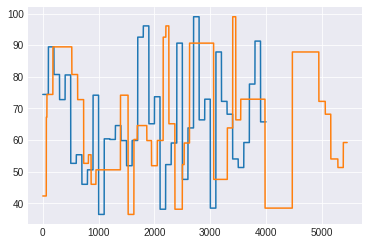

In [66]:
plt.plot(s[0][2000:6000])
plt.plot(s[1][4000:9452])

In [68]:
t = TimeSeriesResampler(sz=4000).fit_transform(s[1][4180:9452])

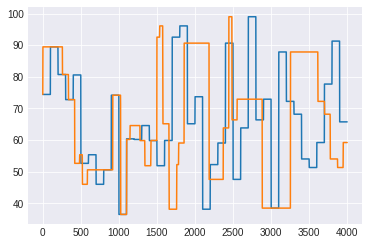

In [69]:
plt.plot(s[0][2000:6000]);
plt.plot(t[0,:].T[0]);

In [76]:
path, sim = metrics.dtw_path(s[0], s[1])

matrix_path = numpy.zeros((len(s[0]), len(s[1])), dtype=numpy.int)
for i, j in path:
    matrix_path[i, j] = 1

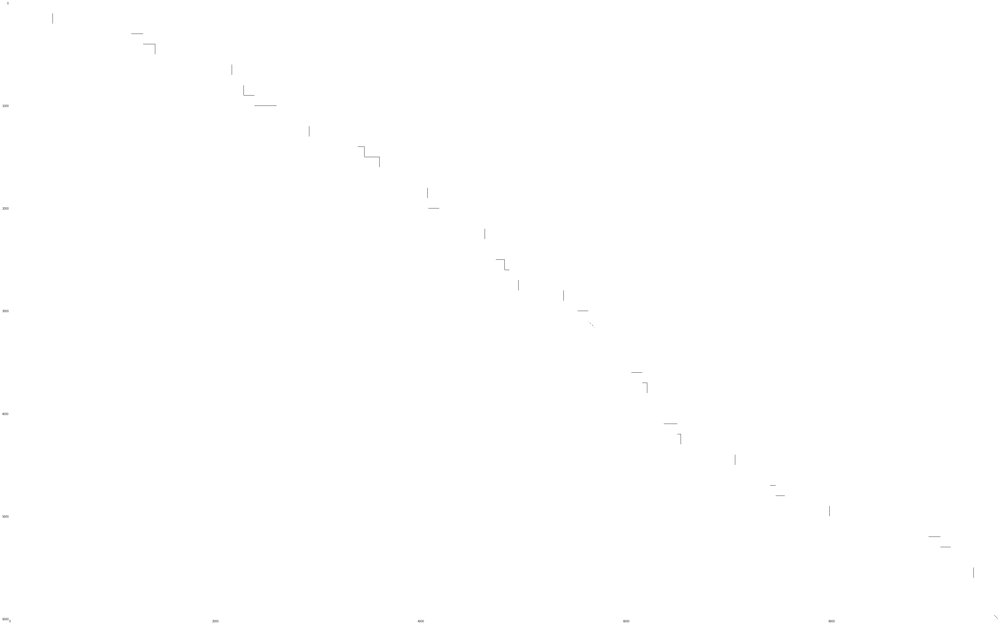

In [77]:
plt.figure(figsize=(60,60))
plt.imshow(matrix_path, cmap="gray_r");

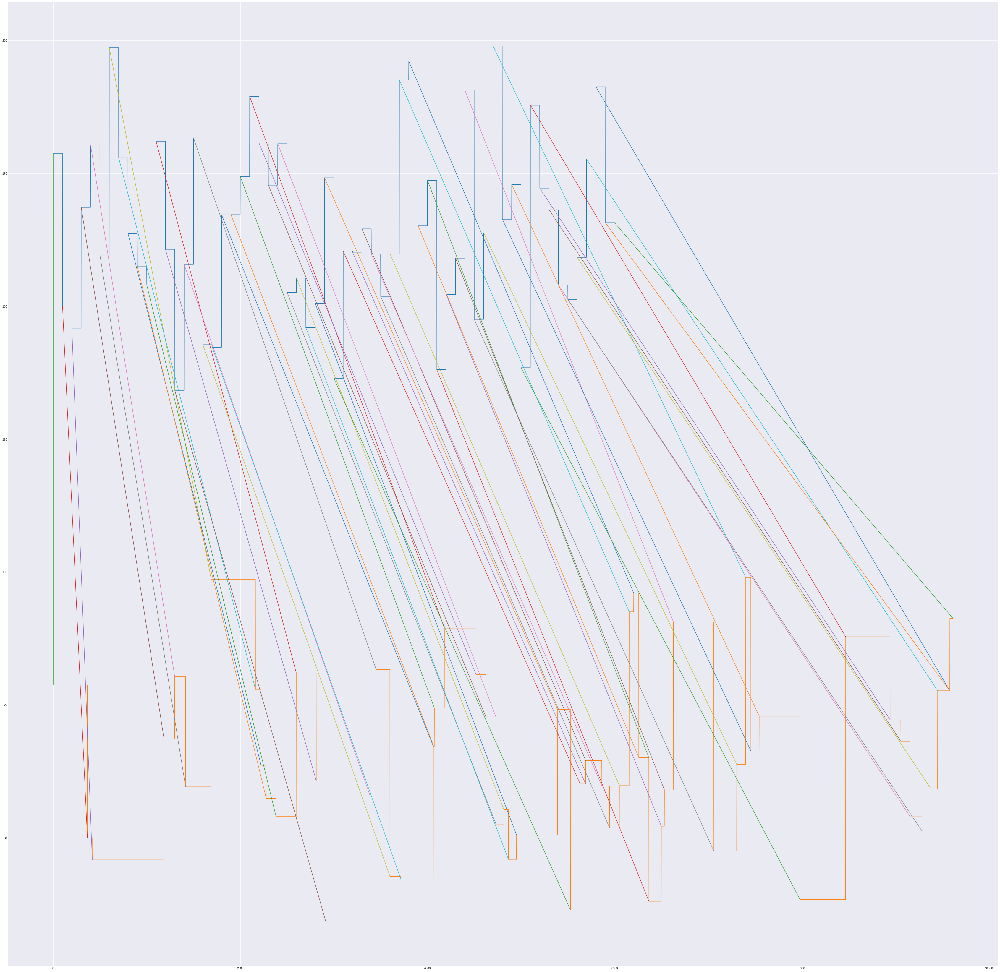

In [127]:
plt.figure(figsize=(60,60))
st = s[0] + 100
plt.plot(st)
plt.plot(s[1])
for i in np.linspace(0,6000,61):
    if i != len(matrix_path):
        #print(i, matrix_path[int(i)].argmax())
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s[1][idx]])
    else:
        i = i -1
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s[1][idx]])

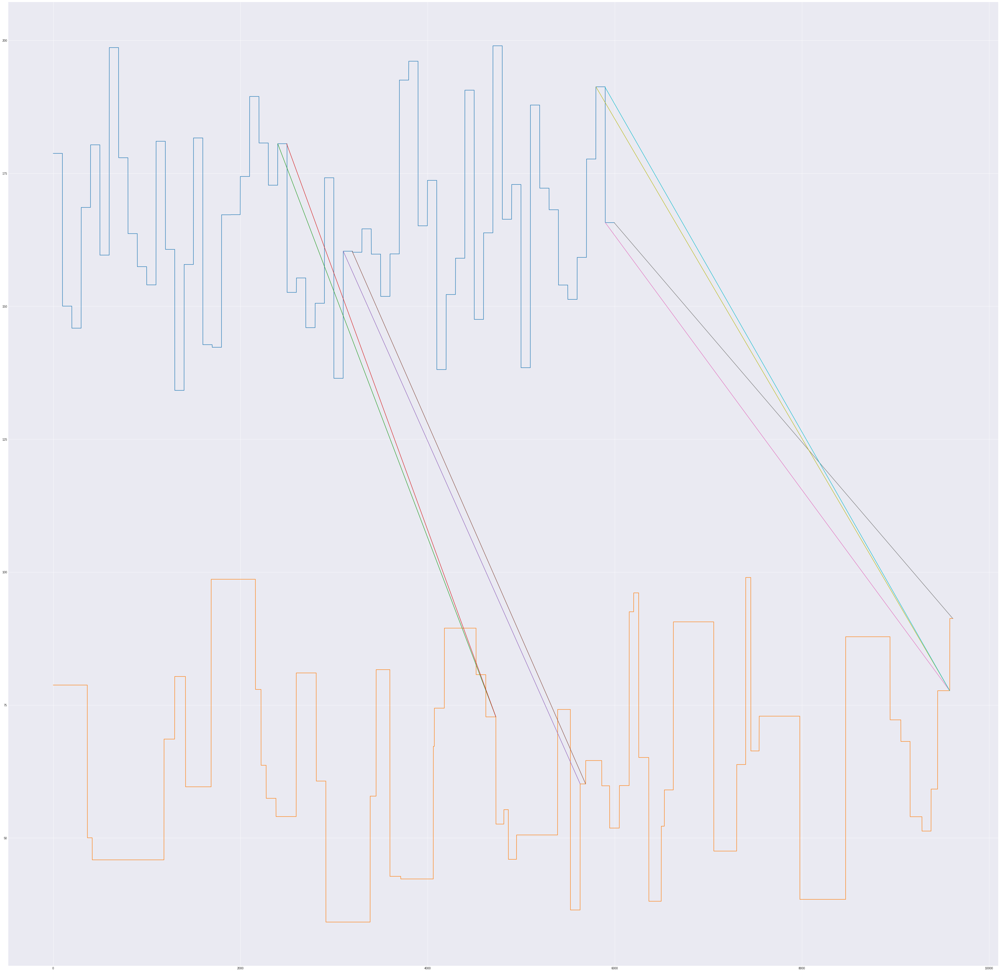

In [150]:
plt.figure(figsize=(60,60))
st = s[0] + 100
plt.plot(st)
plt.plot(s[1])
pos = []
for i in s[3] + [58]:
    pos = pos + [i*100, i*100 + 95]
for i in pos:
    if i != len(matrix_path):
        #print(i, matrix_path[int(i)].argmax())
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s[1][idx]])
    else:
        i = i -1
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s[1][idx]])

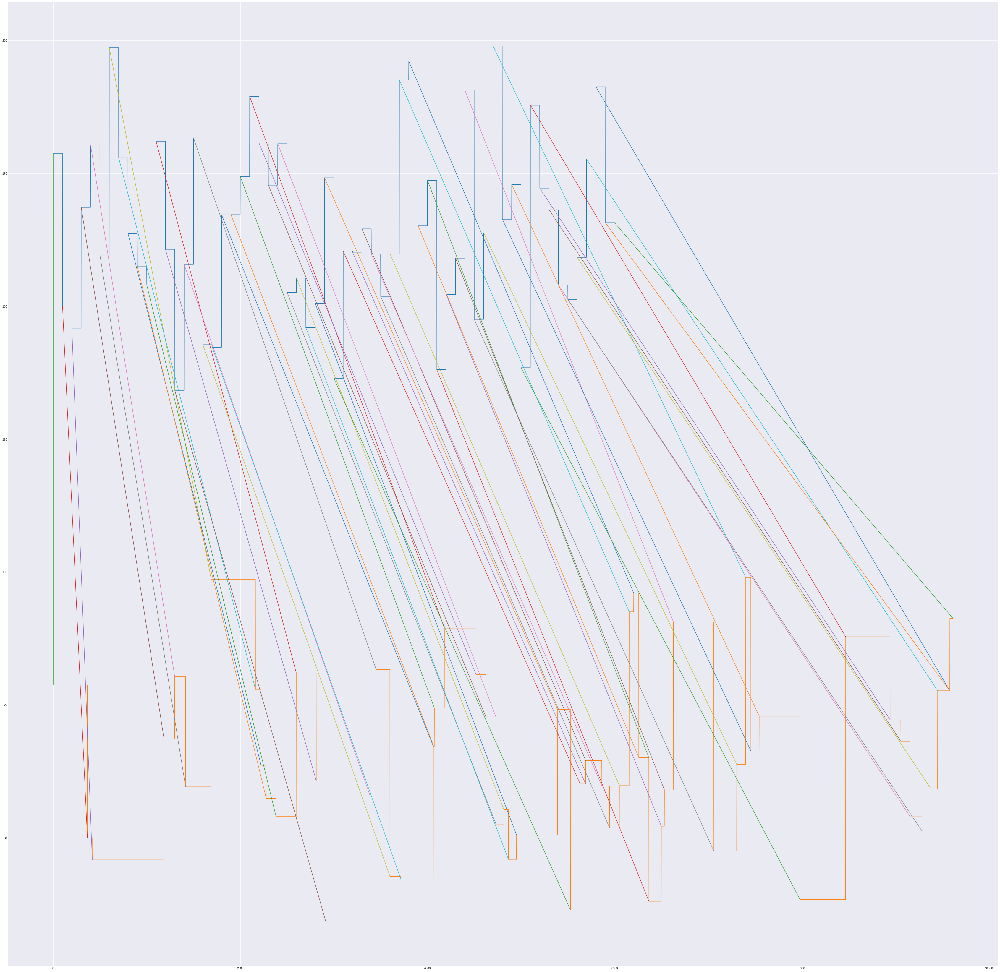

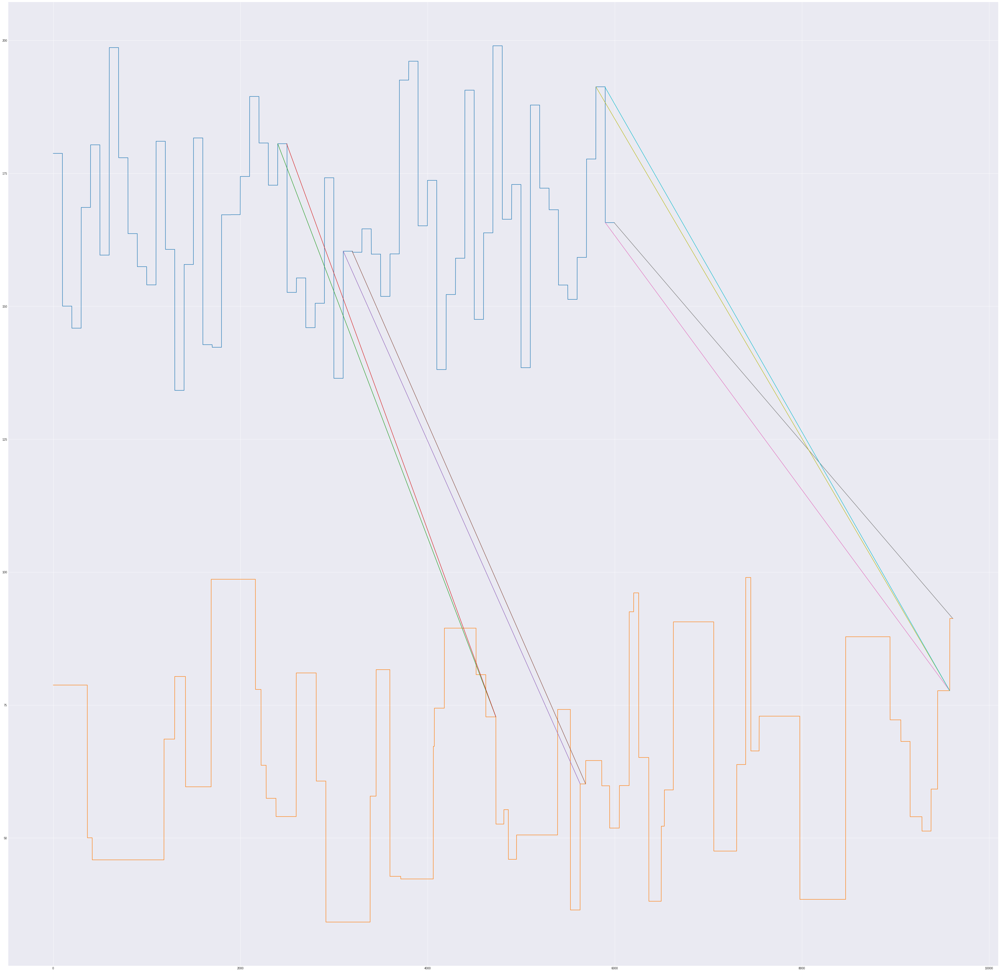

In [151]:
path, sim = metrics.dtw_path(s[0], s[1])

matrix_path = numpy.zeros((len(s[0]), len(s[1])), dtype=numpy.int)
for i, j in path:
    matrix_path[i, j] = 1

plt.figure(figsize=(60,60))
st = s[0] + 100
plt.plot(st)
plt.plot(s[1])
for i in np.linspace(0,6000,61):
    if i != len(matrix_path):
        #print(i, matrix_path[int(i)].argmax())
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s[1][idx]])
    else:
        i = i -1
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s[1][idx]])
        
plt.figure(figsize=(60,60))
st = s[0] + 100
plt.plot(st)
plt.plot(s[1])
pos = []
for i in s[3] + [58]:
    pos = pos + [i*100, i*100 + 95]
for i in pos:
    if i != len(matrix_path):
        #print(i, matrix_path[int(i)].argmax())
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s[1][idx]])
    else:
        i = i -1
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s[1][idx]])

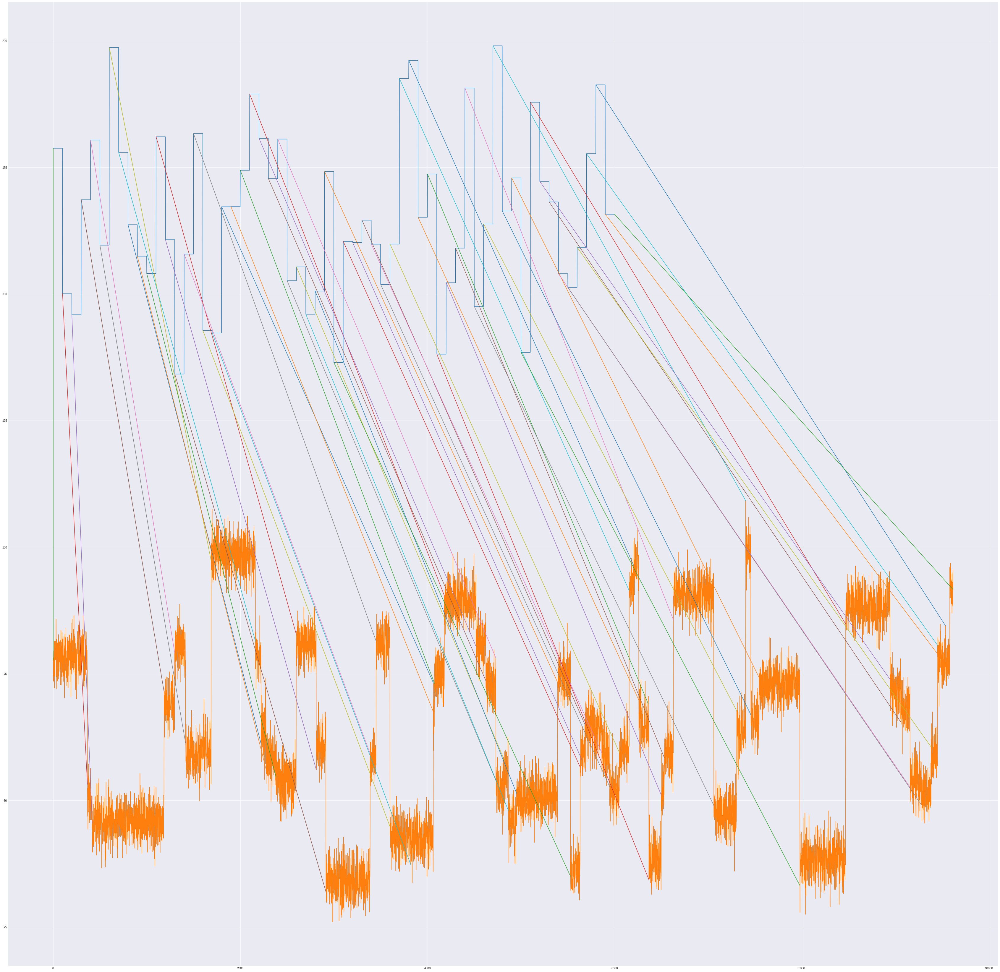

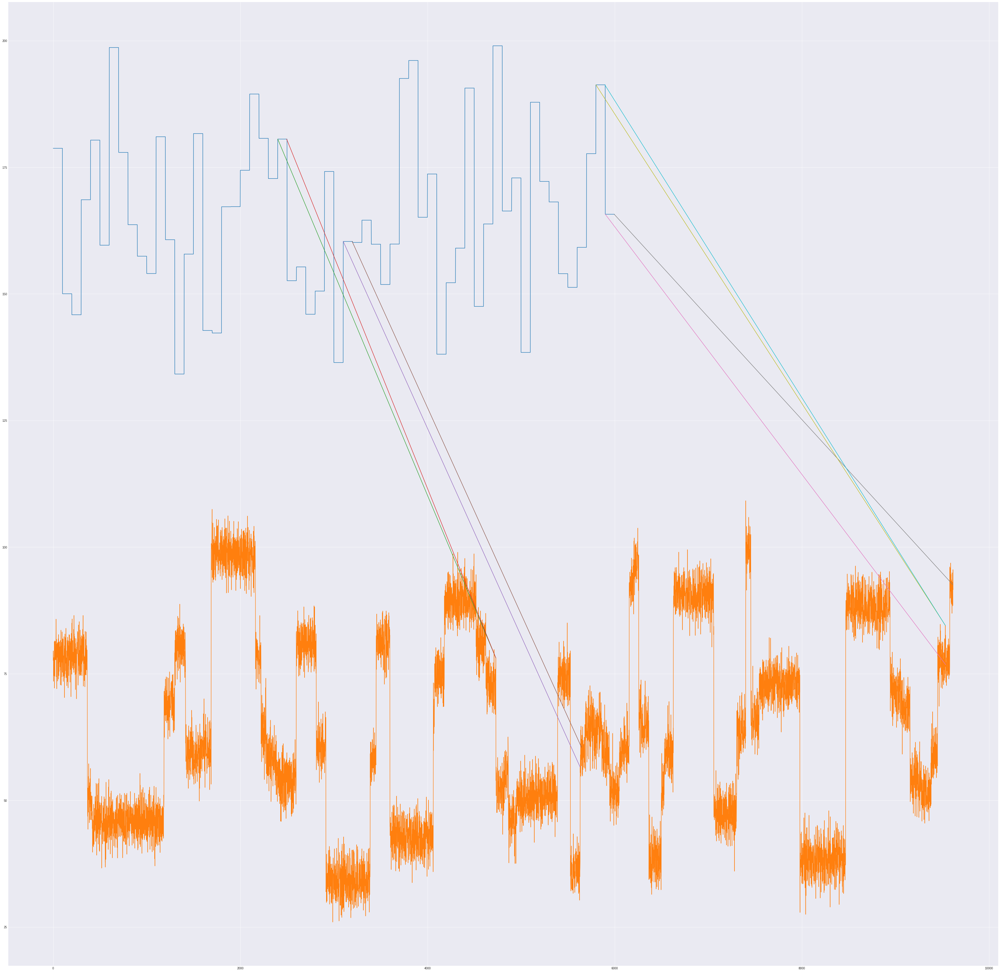

In [152]:
s_1 = s[0]; s_2 = s[2]

path, sim = metrics.dtw_path(s_1, s_2)

matrix_path = numpy.zeros((len(s_1), len(s_2)), dtype=numpy.int)
for i, j in path:
    matrix_path[i, j] = 1

plt.figure(figsize=(60,60))
st = s_1 + 100
plt.plot(st)
plt.plot(s_2)
rag = np.linspace(0,6000,61)
rag[::2] = rag[::2] - 5
for i in rag:
    if i != len(matrix_path):
        #print(i, matrix_path[int(i)].argmax())
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])
    else:
        i = i -1
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])
        
plt.figure(figsize=(60,60))
st = s_1 + 100
plt.plot(st)
plt.plot(s_2)
pos = []
for i in s[3] + [58]:
    pos = pos + [i*100, i*100 + 95]
for i in pos:
    if i != len(matrix_path):
        #print(i, matrix_path[int(i)].argmax())
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])
    else:
        i = i - 1
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])

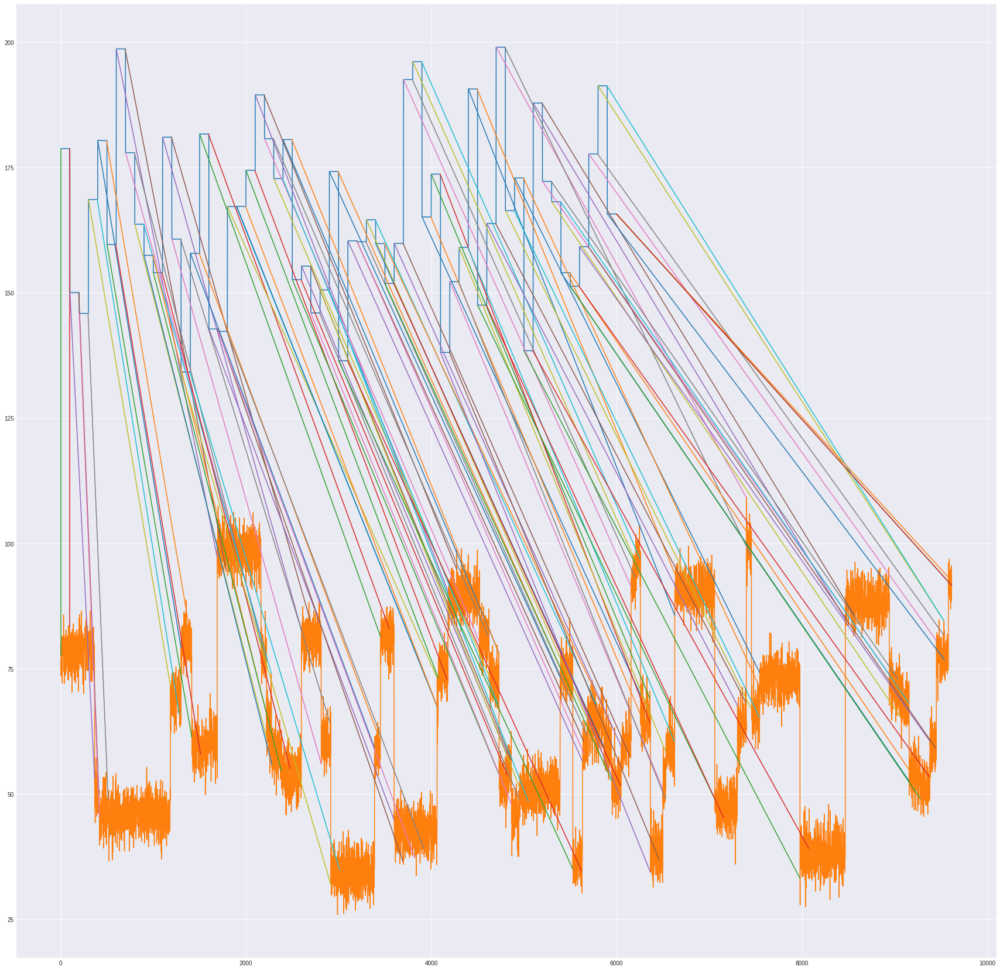

In [189]:
plt.figure(figsize=(30, 30))
st = s_1 + 100
plt.plot(st)
plt.plot(s_2)
rag = np.linspace(0,6000,61)
pos = []
for i in rag:
    if i + 95 < 5999:
        pos = pos + [i, i + 95]
    else:
        pos = pos + [i, 5999]
for i in pos:
    if i != len(matrix_path):
        #print(i, matrix_path[int(i)].argmax())
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])
    else:
        i = i -1
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])

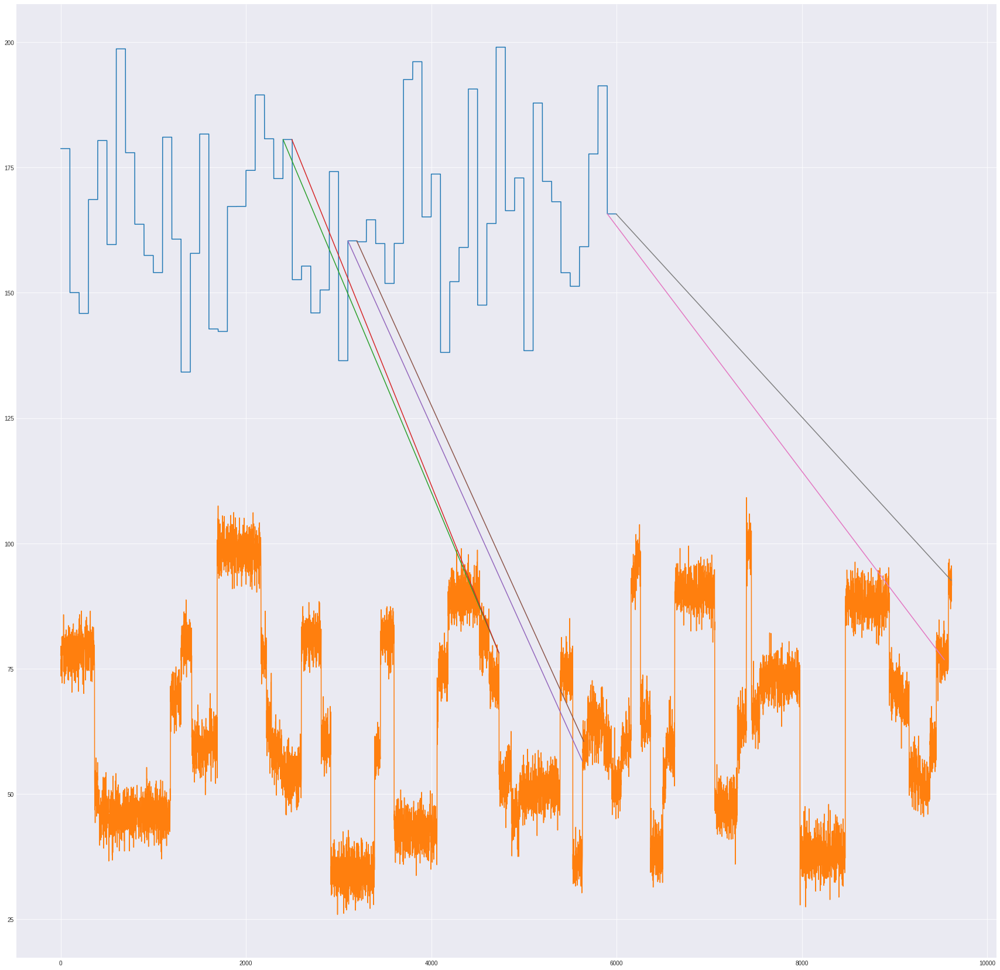

In [188]:
plt.figure(figsize=(30, 30))
st = s_1 + 100
plt.plot(st)
plt.plot(s_2)
pos1 = []
for i in s[3]:
    if i*100 + 95 > 5999:
        pos1 = pos1 + [i*100, 5999]
    else:
        pos1 = pos1 + [i*100, i*100 + 95]
for i in pos1:
    if i < len(matrix_path):
        #print(i, matrix_path[int(i)].argmax())
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])
    else:
        i = i - 1
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])

In [162]:
len(matrix_path[24][matrix_path[24] == 1])

1

In [202]:
pos = []
for idx, i in enumerate(np.linspace(0,6000,61)[:58]):
    i = int(i)
    if abs(matrix_path[i+99].argmax() - matrix_path[i].argmax()) < 20:
        pos = pos + [idx]

In [203]:
pos

[18, 19, 24, 31, 40]

In [184]:
s[3]

[24, 31, 59]

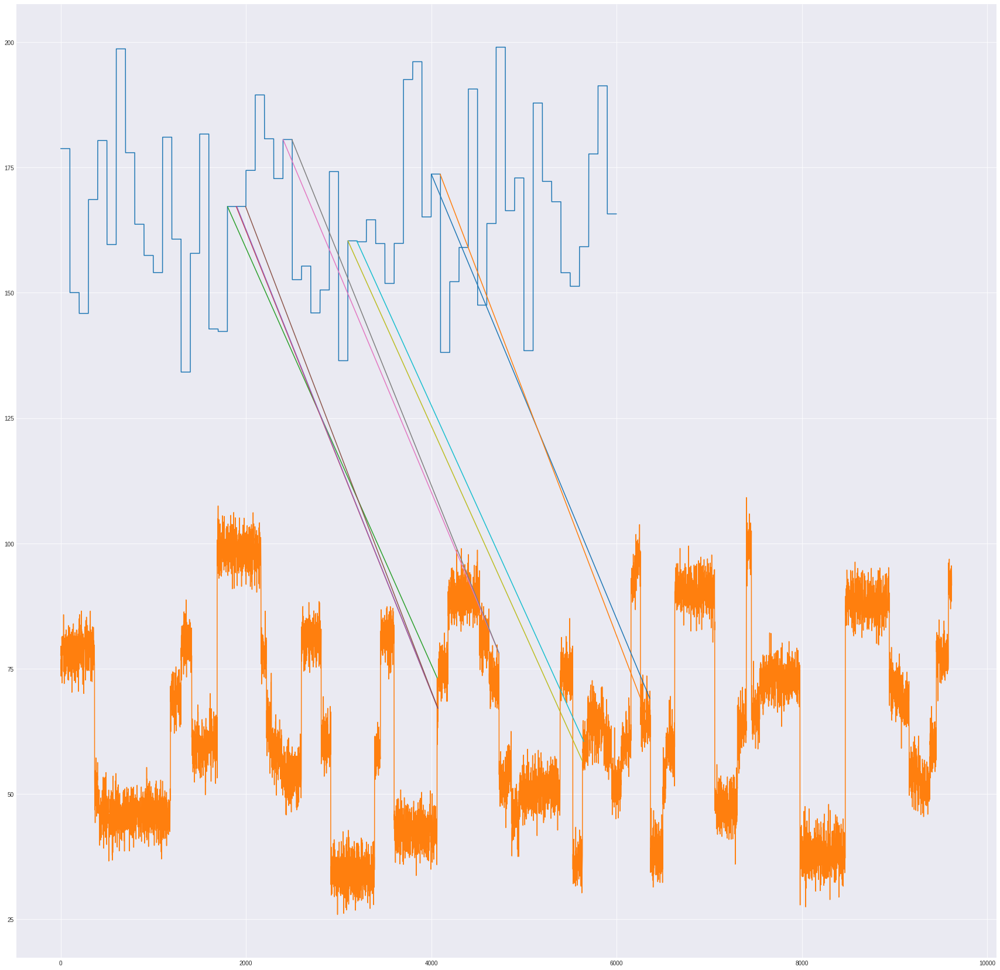

In [201]:
plt.figure(figsize=(30, 30))
st = s_1 + 100
plt.plot(st)
plt.plot(s_2)
pos1 = []
for i in pos:
    if i*100 + 95 > 5999:
        pos1 = pos1 + [i*100, 5999]
    else:
        pos1 = pos1 + [i*100, i*100 + 95]
for i in pos1:
    if i < len(matrix_path):
        #print(i, matrix_path[int(i)].argmax())
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])
    else:
        i = i - 1
        idx = int(matrix_path[int(i)].argmax())
        plt.plot([i, idx], [st[int(i)],s_2[idx]])

In [204]:
event= [] 
pos = []
for idx, i in enumerate(np.linspace(0,6000,61)[:58]):
    i = int(i)
    event = event + [idx]
    pos = pos + [abs(matrix_path[i+99].argmax() - matrix_path[i].argmax())]

In [205]:
#pos

[99,
 50,
 99,
 99,
 99,
 99,
 99,
 59,
 55,
 99,
 99,
 99,
 99,
 99,
 63,
 99,
 99,
 99,
 8,
 3,
 99,
 99,
 99,
 99,
 1,
 91,
 40,
 86,
 99,
 99,
 99,
 16,
 33,
 99,
 83,
 99,
 99,
 47,
 53,
 99,
 6,
 99,
 32,
 95,
 99,
 99,
 95,
 54,
 88,
 99,
 99,
 99,
 99,
 97,
 99,
 99,
 69,
 81]

In [1]:
[2]*29

[2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2]